In [1]:
#Install necessary packages from Requirements file
%pip install -r Requirement.txt

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
#import all the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import itertools
import sys

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix,silhouette_score
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn.mixture import GaussianMixture
from scipy.sparse import csr_matrix
import warnings
import json
import ast
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity



import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth
import spotipy.util as util

warnings.filterwarnings("ignore")

In [3]:
# Load CSV files
artists_df = pd.read_csv('artists.csv')
tracks_df = pd.read_csv('tracks.csv')

Data Exploration

In [4]:
artists_df.head()

,id,followers,genres,name,popularity
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0


In [5]:
tracks_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


In [6]:
# Display data summaries
print(artists_df.info())
print(tracks_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1162095 entries, 0 to 1162094
Data columns (total 5 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   id          1162095 non-null  object 
 1   followers   1162084 non-null  float64
 2   genres      1162095 non-null  object 
 3   name        1162092 non-null  object 
 4   popularity  1162095 non-null  int64  
dtypes: float64(1), int64(1), object(3)
memory usage: 44.3+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586672 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        586672 non-null  int64  
 3   duration_ms       586672 non-null  int64  
 4   explicit          586672 non-null  int64  
 5   artists           586672 non-null  object 
 6   id_artists        5

In [7]:
artists_df['genres'].values[0][0]

'['

We will need to use the genres column from artist dataset for that it is important for us to merge the 2 datasets. First we will convert the list which is present as string to actual list

In [8]:
artists_df['genres_upd'] = artists_df['genres'].apply(lambda x: [re.sub(' ','_',i) for i in re.findall(r"'([^']*)'", x)])

Validation step to check if it worked

In [9]:
artist_df_non_empty_genres = artists_df[artists_df['genres_upd'].apply(lambda x: len(x) > 0)]
artist_df_non_empty_genres.head()

,id,followers,genres,name,popularity,genres_upd
45,0VLMVnVbJyJ4oyZs2L3Yl2,71.0,['carnaval cadiz'],Las Viudas De Los Bisabuelos,6,[carnaval_cadiz]
46,0dt23bs4w8zx154C5xdVyl,63.0,['carnaval cadiz'],Los De Capuchinos,5,[carnaval_cadiz]
47,0pGhoB99qpEJEsBQxgaskQ,64.0,['carnaval cadiz'],Los “Pofesionales”,7,[carnaval_cadiz]
48,3HDrX2OtSuXLW5dLR85uN3,53.0,['carnaval cadiz'],Los Que No Paran De Rajar,6,[carnaval_cadiz]
136,22mLrN5fkppmuUPsHx6i2G,59.0,"['classical harp', 'harp']",Vera Dulova,3,"[classical_harp, harp]"


In [10]:
artist_df_non_empty_genres['genres_upd'].values[0][0]

'carnaval_cadiz'

Genres column is not present as list. We will work on merging the artist dataframe with tracks dataframe.

Step 1: Extract Artist Id as list instead of string

In [11]:
tracks_df['artists_id_updated'] = tracks_df['id_artists'].apply(lambda x: re.findall(r"'([^']*)'", x))
tracks_df['artists_updated_v1'] = tracks_df['artists'].apply(lambda x: re.findall(r"'([^']*)'", x))

In [12]:
tracks_df[tracks_df['artists_updated_v1'].apply(lambda x: not x)].head(5)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_id_updated,artists_updated_v1
164,1xEEYhWxT4WhDQdxfPCT8D,Snake Rag,20,194533,0,"[""King Oliver's Creole Jazz Band""]",['08Zk65toyJllap1MnzljxZ'],1923,0.708,0.361,...,0,0.0441,0.994,0.883,0.103,0.902,105.695,4,[08Zk65toyJllap1MnzljxZ],[]
170,3rauXVLOOM5BlxWqUcDpkg,Chimes Blues,14,170827,0,"[""King Oliver's Creole Jazz Band""]",['08Zk65toyJllap1MnzljxZ'],1923,0.546,0.189,...,1,0.0581,0.996,0.908,0.339,0.554,80.318,4,[08Zk65toyJllap1MnzljxZ],[]
172,1UdqHVRFYMZKU2Q7xkLtYc,Pickin' On Your Baby,11,197493,0,"[""Clarence Williams' Blue Five""]",['6RuQvIr0t0otZHnAxXTGkm'],1923,0.520,0.153,...,1,0.0440,0.995,0.131,0.353,0.319,102.937,4,[6RuQvIr0t0otZHnAxXTGkm],[]
174,0Vl2DO5U6FjgBpzCtBN3OA,Everybody Loves My Baby,10,152507,0,"[""Clarence Williams' Blue Five""]",['6RuQvIr0t0otZHnAxXTGkm'],1923,0.514,0.193,...,0,0.2380,0.996,0.199,0.248,0.665,180.674,4,[6RuQvIr0t0otZHnAxXTGkm],[]
180,5SvyP1ZeJX1jA7AOZD08NA,Tears,10,187227,0,"[""King Oliver's Creole Jazz Band""]",['08Zk65toyJllap1MnzljxZ'],1923,0.359,0.357,...,1,0.0511,0.994,0.819,0.290,0.753,205.053,4,[08Zk65toyJllap1MnzljxZ],[]


Validation Step

In [13]:
tracks_df[tracks_df['artists_id_updated'].apply(lambda x: not x)].head(5)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_id_updated,artists_updated_v1


We covered all of them, but we will still add a safety net in case if another special characters occurs than the ones used above.

In [14]:
tracks_df['artists_upd_v2'] = tracks_df['artists'].apply(lambda x: re.findall('\"(.*?)\"',x))
tracks_df['artists_updated'] = np.where(tracks_df['artists_updated_v1'].apply(lambda x: not x), tracks_df['artists_upd_v2'], tracks_df['artists_updated_v1'])

In [15]:
tracks_df['artists_updated'].values[0][0]

'Uli'

Duplicate and Null Checks after artist Id conversion

In [16]:
tracks_df[tracks_df['artists_updated'].apply(lambda x: len(x) == 0)].head(5)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_id_updated,artists_updated_v1,artists_upd_v2,artists_updated


In [17]:
tracks_df['artist_song'] = tracks_df.apply(lambda row: str(row['artists_updated'][0]) + str(row['name']), axis = 1 )

In [18]:
tracks_df[tracks_df['name']=='Adore You']

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,instrumentalness,liveness,valence,tempo,time_signature,artists_id_updated,artists_updated_v1,artists_upd_v2,artists_updated,artist_song
86217,5AnCLGg35ziFOloEnXK4uu,Adore You,71,278747,0,['Miley Cyrus'],['5YGY8feqx7naU7z4HrwZM6'],2013-10-04,0.583,0.655,...,0.000004,0.113,0.201,119.759,4,[5YGY8feqx7naU7z4HrwZM6],[Miley Cyrus],[],[Miley Cyrus],Miley CyrusAdore You
91884,3jjujdWJ72nww5eGnfs2E7,Adore You,88,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-13,0.676,0.771,...,0.000007,0.102,0.569,99.048,4,[6KImCVD70vtIoJWnq6nGn3],[Harry Styles],[],[Harry Styles],Harry StylesAdore You
92524,1M4qEo4HE3PRaCOM7EXNJq,Adore You,74,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-06,0.676,0.771,...,0.000007,0.102,0.569,99.048,4,[6KImCVD70vtIoJWnq6nGn3],[Harry Styles],[],[Harry Styles],Harry StylesAdore You


Even though artist Id are unique we have still have duplicates, which we can see from the final column in dataset

In [19]:
tracks_df.drop_duplicates(subset='artist_song', inplace=True)

Validation Step:

In [20]:
tracks_df[tracks_df['name'] == 'Adore You']

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,instrumentalness,liveness,valence,tempo,time_signature,artists_id_updated,artists_updated_v1,artists_upd_v2,artists_updated,artist_song
86217,5AnCLGg35ziFOloEnXK4uu,Adore You,71,278747,0,['Miley Cyrus'],['5YGY8feqx7naU7z4HrwZM6'],2013-10-04,0.583,0.655,...,0.000004,0.113,0.201,119.759,4,[5YGY8feqx7naU7z4HrwZM6],[Miley Cyrus],[],[Miley Cyrus],Miley CyrusAdore You
91884,3jjujdWJ72nww5eGnfs2E7,Adore You,88,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-13,0.676,0.771,...,0.000007,0.102,0.569,99.048,4,[6KImCVD70vtIoJWnq6nGn3],[Harry Styles],[],[Harry Styles],Harry StylesAdore You


Step 2: Explode tracks df so that each artist has their own row

In [21]:
artists_exploded = tracks_df[['artists_updated','id']].explode('artists_updated')

In [22]:
artists_exploded_enrich = artists_exploded.merge(artist_df_non_empty_genres, how = 'left', left_on = 'artists_updated',right_on ='name' )

In [23]:
artists_exploded_enrich.head()

,artists_updated,id_x,id_y,followers,genres,name,popularity,genres_upd
0,Uli,35iwgR4jXetI318WEWsa1Q,NaN,NaN,NaN,NaN,NaN,NaN
1,Fernando Pessoa,021ht4sdgPcrDgSk7JTbKY,NaN,NaN,NaN,NaN,NaN,NaN
2,Ignacio Corsini,07A5yehtSnoedViJAZkNnc,5LiOoJbxVSAMkBS2fUm3X2,3528.0,"['tango', 'vintage tango']",Ignacio Corsini,23.0,"[tango, vintage_tango]"
3,Ignacio Corsini,08FmqUhxtyLTn6pAh6bk45,5LiOoJbxVSAMkBS2fUm3X2,3528.0,"['tango', 'vintage tango']",Ignacio Corsini,23.0,"[tango, vintage_tango]"
4,Dick Haymes,08y9GfoqCWfOGsKdwojr5e,3BiJGZsyX9sJchTqcSA7Su,11327.0,"['adult standards', 'big band', 'easy listenin...",Dick Haymes,35.0,"[adult_standards, big_band, easy_listening, lo..."


Formatting, handling Nan's and renaming columns:

In [24]:
artists_exploded_enrich.drop(columns=['id_y'],inplace=True)

In [25]:
artists_exploded_enrich.rename(columns={'id_x': 'id'}, inplace=True)

In [26]:
artists_exploded_enrich.dropna(subset = ['genres_upd'],inplace=True)

In [27]:
artists_exploded_enrich.head()

,artists_updated,id,followers,genres,name,popularity,genres_upd
2,Ignacio Corsini,07A5yehtSnoedViJAZkNnc,3528.0,"['tango', 'vintage tango']",Ignacio Corsini,23.0,"[tango, vintage_tango]"
3,Ignacio Corsini,08FmqUhxtyLTn6pAh6bk45,3528.0,"['tango', 'vintage tango']",Ignacio Corsini,23.0,"[tango, vintage_tango]"
4,Dick Haymes,08y9GfoqCWfOGsKdwojr5e,11327.0,"['adult standards', 'big band', 'easy listenin...",Dick Haymes,35.0,"[adult_standards, big_band, easy_listening, lo..."
5,Dick Haymes,0BRXJHRNGQ3W4v9frnSfhu,11327.0,"['adult standards', 'big band', 'easy listenin...",Dick Haymes,35.0,"[adult_standards, big_band, easy_listening, lo..."
7,Mistinguett,0IA0Hju8CAgYfV1hwhidBH,5078.0,['vintage chanson'],Mistinguett,22.0,[vintage_chanson]


Creating Consolidated Genres List

In [28]:
artists_consolidated_genres = artists_exploded_enrich.groupby('id')['genres_upd'].apply(list).reset_index()
artists_consolidated_genres['genres_consolidated'] = artists_consolidated_genres['genres_upd'].apply(lambda x: list(set(list(itertools.chain.from_iterable(x)))))

In [29]:
artists_consolidated_genres.head()

,id,genres_upd,genres_consolidated
0,0004Uy71ku11n3LMpuyf59,[[polish_rock]],[polish_rock]
1,000CSYu4rvd8cQ7JilfxhZ,"[[country_quebecois, rock_quebecois]]","[rock_quebecois, country_quebecois]"
2,000DsoWJKHdaUmhgcnpr8j,[[barnmusik]],[barnmusik]
3,000G1xMMuwxNHmwVsBdtj1,"[[candy_pop, new_wave, new_wave_pop, permanent...","[candy_pop, power_pop, permanent_wave, new_wav..."
4,000KblXP5csWFFFsD6smOy,"[[chamame, folclore_salteno, folklore_argentino]]","[folclore_salteno, chamame, folklore_argentino]"


Step 3: Merging the 2 datasets

In [30]:
tracks_final_1 = tracks_df.merge(artists_consolidated_genres[['id','genres_consolidated']], on='id', how='left')

In [31]:
tracks_final_1.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,liveness,valence,tempo,time_signature,artists_id_updated,artists_updated_v1,artists_upd_v2,artists_updated,artist_song,genres_consolidated
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,...,0.151,0.127,104.851,3,[45tIt06XoI0Iio4LBEVpls],[Uli],[],[Uli],UliCarve,NaN
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,...,0.148,0.655,102.009,1,[14jtPCOoNZwquk5wd9DxrY],[Fernando Pessoa],[],[Fernando Pessoa],Fernando PessoaCapítulo 2.16 - Banquero Anarqu...,NaN
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,...,0.212,0.457,130.418,5,[5LiOoJbxVSAMkBS2fUm3X2],[Ignacio Corsini],[],[Ignacio Corsini],Ignacio CorsiniVivo para Quererte - Remasterizado,"[tango, vintage_tango]"
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,...,0.104,0.397,169.980,3,[5LiOoJbxVSAMkBS2fUm3X2],[Ignacio Corsini],[],[Ignacio Corsini],Ignacio CorsiniEl Prisionero - Remasterizado,"[tango, vintage_tango]"
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,...,0.311,0.196,103.220,4,[3BiJGZsyX9sJchTqcSA7Su],[Dick Haymes],[],[Dick Haymes],Dick HaymesLady of the Evening,"[big_band, lounge, adult_standards, easy_liste..."


Handling nulls from genres_consolidated columns

In [32]:
tracks_final_1['genres_consolidated'] = tracks_final_1['genres_consolidated'].apply(lambda x: x if isinstance(x,list) else [])

Formatting release date column to only pull information about year

In [33]:
tracks_final_1['year'] = tracks_final_1['release_date'].apply(lambda x: x.split('-')[0])

In [34]:
tracks_final_1.shape[0]

523475

Filter songs only to use release date > 1990, adding dimensionality reduction for smooth processing of TF-IDF

In [35]:
tracks_final = tracks_final_1[tracks_final_1['year']>'1990']

In [36]:
tracks_final.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,valence,tempo,time_signature,artists_id_updated,artists_updated_v1,artists_upd_v2,artists_updated,artist_song,genres_consolidated,year
37116,6catF1lDhNTjjGa2GxRQNN,You'll Never Walk Alone - Mono; 2002 Remaster,56,160187,0,['Gerry & The Pacemakers'],['3UmBeGyNwr4iDWi1vTxWi8'],2008-02-11,0.484,0.265,...,0.285,113.564,3,[3UmBeGyNwr4iDWi1vTxWi8],[Gerry & The Pacemakers],[],[Gerry & The Pacemakers],Gerry & The PacemakersYou'll Never Walk Alone ...,"[british_invasion, folk_rock, adult_standards,...",2008
37126,6Pkt6qVikqPBt9bEQy8iTz,A Lover's Concerto,41,159560,0,['The Toys'],['6lH5PpuiMa5SpfjoIOlwCS'],2020-03-13,0.671,0.867,...,0.839,120.689,4,[6lH5PpuiMa5SpfjoIOlwCS],[The Toys],[],[The Toys],The ToysA Lover's Concerto,[thai_pop],2020
37132,4aSw1QJIMwYSoDEgzgdCJL,Ferry Cross the Mersey - Mono; 2002 Remaster,40,141987,0,['Gerry & The Pacemakers'],['3UmBeGyNwr4iDWi1vTxWi8'],2008-02-11,0.405,0.365,...,0.588,104.536,4,[3UmBeGyNwr4iDWi1vTxWi8],[Gerry & The Pacemakers],[],[Gerry & The Pacemakers],Gerry & The PacemakersFerry Cross the Mersey -...,"[british_invasion, folk_rock, adult_standards,...",2008
37136,0ZMMtH875IR2TfkyC4PolD,Don't Let the Sun Catch You Crying (Main) - Mono,34,157093,0,['Gerry & The Pacemakers'],['3UmBeGyNwr4iDWi1vTxWi8'],2008-02-11,0.477,0.352,...,0.478,106.773,4,[3UmBeGyNwr4iDWi1vTxWi8],[Gerry & The Pacemakers],[],[Gerry & The Pacemakers],Gerry & The PacemakersDon't Let the Sun Catch ...,"[british_invasion, folk_rock, adult_standards,...",2008
37143,1hx7X9cMXHWJjknb9O6Ava,The September Of My Years - Live At The Sands ...,26,187333,0,['Frank Sinatra'],['1Mxqyy3pSjf8kZZL4QVxS0'],2018-05-04,0.319,0.201,...,0.239,117.153,3,[1Mxqyy3pSjf8kZZL4QVxS0],[Frank Sinatra],[],[Frank Sinatra],Frank SinatraThe September Of My Years - Live ...,"[adult_standards, lounge, easy_listening]",2018


In [37]:
tracks_final.shape

(274899, 27)

In [38]:
#Check for month data availability
num_with_month = tracks_final['release_date'].apply(lambda x: '-' in x and len(x.split('-')) > 1).sum()
print(f"Number of records with month information: {num_with_month}")

Number of records with month information: 239366


We have close to 90% of records with month data, we can use month data to give seasonal essence to songs predictions

In [39]:
tracks_final['month'] = tracks_final['release_date'].apply(
    lambda x: x.split('-')[1] if '-' in x and len(x.split('-')) > 1 else '01'
)

In [40]:
month_counts = tracks_final['month'].value_counts().sort_index()
print(month_counts)

month
01    90493
02    13485
03    17342
04    14872
05    15756
06    16444
07    15037
08    13869
09    17639
10    18985
11    20360
12    20617
Name: count, dtype: int64


Float Columns Extraction for normalization

In [41]:
float_columns = tracks_final.select_dtypes(include=['float64']).columns

Defining OHE Column

In [42]:
ohe_column = 'popularity'
#Create buckets for popularity
tracks_final['popularity_bucket'] = tracks_final['popularity'].apply(lambda x: int(x/5) )

Defining OHE Function

In [43]:
def ohe_prep(df, column, new_column):
    tf_df = pd.get_dummies(df[column])
    feature_columns = tf_df.columns
    tf_df.columns = [new_column + "|" + str(i) for i in feature_columns]
    tf_df.reset_index(drop = True, inplace = True)
    return tf_df

Create complete feature set generation function

In [44]:
def create_feature_set(df, float_cols):    
    #tfidf genre lists
    tfidf = TfidfVectorizer(max_features=2000)
    tfidf_matrix =  tfidf.fit_transform(df['genres_consolidated'].apply(lambda x: " ".join(x)))
    genre_df = pd.DataFrame(tfidf_matrix.toarray())
    genre_df.columns = ['genre' + "|" + i for i in tfidf.get_feature_names_out()]
    genre_df.reset_index(drop = True, inplace=True)

    #explicity_ohe = ohe_prep(df, 'explicit','exp')    
    year_ohe = ohe_prep(df, 'year','year') * 0.5
    month_ohe = ohe_prep(df, 'month','month') * 0.5
    popularity_ohe = ohe_prep(df, 'popularity_bucket','popularity_new') * 0.15

    #scale float columns
    floats = df[float_cols].reset_index(drop = True)
    #scaler = MinMaxScaler()
    scaler = StandardScaler()
    floats_scaled = pd.DataFrame(scaler.fit_transform(floats), columns = floats.columns) * 0.2

    #concanenate all features
    final = pd.concat([genre_df, floats_scaled, popularity_ohe, year_ohe], axis = 1)
     
    #add song id
    final['id']=df['id'].values
    
    return final

Generating full feature set for our dataset

In [45]:
complete_feature_set = create_feature_set(tracks_final,float_columns)

In [46]:
complete_feature_set.head()

,genre|_brasileira,genre|_hip_hop,genre|abstract_hip_hop,genre|acid_house,genre|acid_jazz,genre|acid_rock,genre|acoustic,genre|acoustic_pop,genre|adoracao,genre|adoracion,...,year|2013,year|2014,year|2015,year|2016,year|2017,year|2018,year|2019,year|2020,year|2021,id
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6catF1lDhNTjjGa2GxRQNN
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,6Pkt6qVikqPBt9bEQy8iTz
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4aSw1QJIMwYSoDEgzgdCJL
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0ZMMtH875IR2TfkyC4PolD
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,1hx7X9cMXHWJjknb9O6Ava


Connecting to Spotify API

In [47]:
import os
for f in os.listdir():
    if f.startswith('.cache'):
        os.remove(f)

In [ ]:
#client id and secret for my application
client_id = ''
client_secret= ''

In [49]:
scope  = 'user-library-read'
auth_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(auth_manager=auth_manager)

In [50]:
token = util.prompt_for_user_token(scope, client_id= client_id, client_secret=client_secret, redirect_uri='https://127.0.0.1:8080/callback')

Enter the URL you were redirected to:  https://127.0.0.1:8080/callback?code=AQBl8suBWAK9OqKwYtf6IylL7A3soYgswoi9_kZcz1rdh0JKCW5T1A-9s6mpGC-pLQPrIre-cU-npKbGBTj7ulcqY5nHDw4wDMLMJhPqtfkMPsNvNXpe2nAm-gumCars-6d8_sDkVyXM8g70-H9qDX1UQ6unbhRbBXy2GzG258ncWvM


In [51]:
sp = spotipy.Spotify(auth=token)

Gather playlist names and images.

In [52]:
id_name = {}
list_photo = {}
for i in sp.current_user_playlists()['items']:

    id_name[i['name']] = i['uri'].split(':')[2]
    list_photo[i['uri'].split(':')[2]] = i['images'][0]['url']

In [53]:
id_name

{'🎀': '2n0sEFHOrFxoqawAFP0DJD',
 'After Party Drunk Playlist': '3jg5PaycUd90ecYdmtHX5C',
 'Bollywood 2000': '3iEpwvaKmiu1WbiEA92cOB',
 'Marathi': '1y0SBO6zFHZV38B67Lz9JV',
 'Meditation': '24ZtTYr7jUtlaIOZcxb13E',
 'Pop': '7pLJEqgQxuWnuMfzWK1LV2',
 'KK': '59GrZhHbStyMXC1YI24JwE',
 'Workout': '4aKHC2ImK5Bkkg5g0mGQZ3',
 'Mind power': '7Gd6dbhaYVRSM30iFRXa4a',
 'Shower': '6MW28Ywet8jPi8AnDUwCry',
 'Mumbai': '4FNXhNWFqdAGsnNmwGTG6z',
 'Rock': '3nGBP4gdpqgqXn0qkN7OZP'}

Generating output to show list of songs in a playlist pulled using spotify API

In [54]:
def create_playlist_output(playlist_name,id_dic,df):
    #playlist dataframe
    playlist = pd.DataFrame()
    playlist_name = playlist_name

    for ix,i in enumerate(sp.playlist(id_dic[playlist_name])['tracks']['items']):
        playlist.loc[ix, 'artist'] = i['track']['artists'][0]['name']
        playlist.loc[ix, 'name'] = i['track']['name']
        playlist.loc[ix, 'id'] = i['track']['id'] # ['uri'].split(':')[2]
        #playlist.loc[ix, 'url'] = i['track']['album']['images'][0]['url']
        # Fix: handle varying image list sizes
        images = i['track']['album']['images']
        playlist.loc[ix, 'url'] = images[1]['url'] if len(images) > 1 else images[0]['url'] if images else None
        playlist.loc[ix, 'date_added'] = i['added_at']
        
    playlist['date_added'] = pd.to_datetime(playlist['date_added'])  
    
    playlist = playlist[playlist['id'].isin(df['id'].values)].sort_values('date_added',ascending = False) 

    return playlist

In [55]:
playlist_mumbai = create_playlist_output('Mumbai',id_name,tracks_final)

In [57]:
default_image = 'https://i.ibb.co/rx5DFbs/spotify-logo.png' #Default image in case spotify is not able to pull the images

In [58]:
from skimage import io
import matplotlib.pyplot as plt

def visualize_songs(df,fallback_image):
    """ 
    Visualize cover art of the songs in the inputted dataframe

    Parameters: 
        df (pandas dataframe): Playlist Dataframe
    """
    
    temp = df['url'].values
    plt.figure(figsize=(15,int(0.625 * len(temp))))
    columns = 5
    
    for i, url in enumerate(temp):
        plt.subplot(len(temp) // columns + 1, columns, i + 1)

        try:
            if pd.isna(url) or url == '':
                raise ValueError("Invalid URL")
            image = io.imread(url)
        except:
            image = io.imread(fallback_image)        

        plt.imshow(image)
        plt.xticks(color = 'w', fontsize = 0.1)
        plt.yticks(color = 'w', fontsize = 0.1)
        plt.xlabel(df['name'].values[i], fontsize = 12)
        plt.tight_layout(h_pad=0.4, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)

    plt.show()

In [59]:
playlist_mumbai

,artist,name,id,url,date_added
87,Atif Aslam,Piya O Re Piya,5a11x5PUFvJEadMRqtNtTr,https://i.scdn.co/image/ab67616d00001e029546c2...,2025-01-10 00:55:31+00:00
86,Amaal Mallik,"Chale Aana (From ""De De Pyaar De"")",6vuMdb0E8buJeSHArN3dXk,https://i.scdn.co/image/ab67616d00001e027d8baa...,2025-01-10 00:49:26+00:00
85,Pritam,Teri Jhuki Nazar,3beYHVCFKzbdNjJqjKeYpM,https://i.scdn.co/image/ab67616d00001e02947e91...,2025-01-09 17:07:54+00:00
84,Armaan Malik,Jab Tak,35RWttZt8zGGzT0mWtlXpn,https://i.scdn.co/image/ab67616d00001e0202dde7...,2025-01-09 17:07:42+00:00
83,Ed Sheeran,Photograph,1HNkqx9Ahdgi1Ixy2xkKkL,https://i.scdn.co/image/ab67616d00001e0213b3e3...,2025-01-09 17:05:47+00:00
...,...,...,...,...,...
5,Ved Sharma,"Malang (Title Track) [From ""Malang - Unleash T...",25MPTnqXQB1H6OkwSYUXWx,https://i.scdn.co/image/ab67616d00001e02996554...,2020-04-26 21:58:54+00:00
4,Pritam,Khairiyat,5O932cZmzOZGOGZz9RHx20,https://i.scdn.co/image/ab67616d00001e02eaa6b4...,2020-04-26 21:58:47+00:00
3,Pritam,Tujhe Sochta Hoon,47l2Dd3XPBLio3kjbEMyDJ,https://i.scdn.co/image/ab67616d00001e0271da5e...,2020-04-26 21:58:37+00:00
2,Arijit Singh,Phir Kabhi,4jk4CaqBMBbMZhf3PuR1ai,https://i.scdn.co/image/ab67616d00001e0202dde7...,2020-04-26 21:58:20+00:00


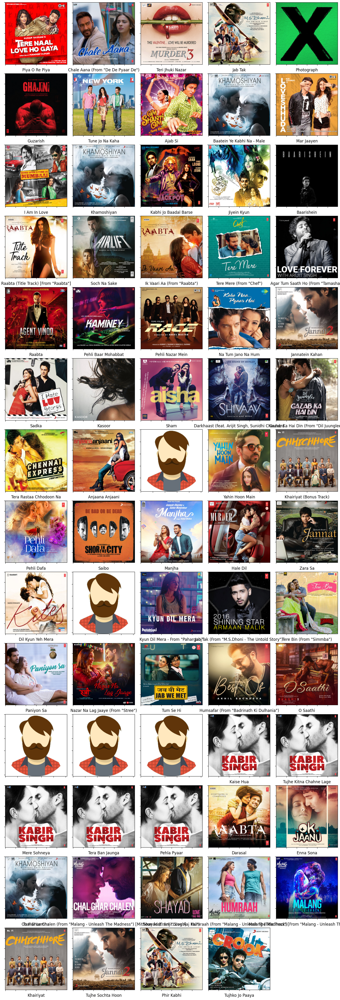

In [60]:
visualize_songs(playlist_mumbai,default_image)

Generating complete single summarized feature vector for users playlist

In [61]:
def generate_playlist_feature(complete_feature_set, playlist_df, weight_factor):
    
    complete_feature_set_playlist = complete_feature_set[complete_feature_set['id'].isin(playlist_df['id'].values)]#.drop('id', axis = 1).mean(axis =0)
    complete_feature_set_playlist = complete_feature_set_playlist.merge(playlist_df[['id','date_added']], on = 'id', how = 'inner')
    complete_feature_set_nonplaylist = complete_feature_set[~complete_feature_set['id'].isin(playlist_df['id'].values)]#.drop('id', axis = 1)
    
    playlist_feature_set = complete_feature_set_playlist.sort_values('date_added',ascending=False)

    most_recent_date = playlist_feature_set.iloc[0,-1]
    
    for ix, row in playlist_feature_set.iterrows():
        playlist_feature_set.loc[ix,'months_from_recent'] = int((most_recent_date.to_pydatetime() - row.iloc[-1].to_pydatetime()).days / 30)
        
    playlist_feature_set['weight'] = playlist_feature_set['months_from_recent'].apply(lambda x: weight_factor ** (-x))
    
    playlist_feature_set_weighted = playlist_feature_set.copy()
    #print(playlist_feature_set_weighted.iloc[:,:-4].columns)
    playlist_feature_set_weighted.update(playlist_feature_set_weighted.iloc[:,:-4].mul(playlist_feature_set_weighted.weight,0))
    playlist_feature_set_weighted_final = playlist_feature_set_weighted.iloc[:, :-4]
    #playlist_feature_set_weighted_final['id'] = playlist_feature_set['id']
    
    return playlist_feature_set_weighted_final.sum(axis = 0), complete_feature_set_nonplaylist

In [62]:
complete_feature_set_playlist_vector_mumbai, complete_feature_set_nonplaylist_mumbai = generate_playlist_feature(complete_feature_set, playlist_mumbai, 1.09)

Generate recommendations using cosine similarity

In [63]:
def generate_playlist_recos(df, features, nonplaylist_features):

    
    non_playlist_df = df[df['id'].isin(nonplaylist_features['id'].values)]
    non_playlist_df['sim'] = cosine_similarity(nonplaylist_features.drop('id', axis = 1).values, features.values.reshape(1, -1))[:,0]
    non_playlist_df_top_40 = non_playlist_df.sort_values('sim',ascending = False).head(40)
    non_playlist_df_top_40['url'] = non_playlist_df_top_40['id'].apply(lambda x: sp.track(x)['album']['images'][1]['url'])
    
    return non_playlist_df_top_40

In [64]:
def generate_playlist_recos_2(df, features, nonplaylist_features, fallback_url='https://i.ibb.co/rx5DFbs/spotify-logo.png'):
    # Filter non-playlist songs
    non_playlist_df = df[df['id'].isin(nonplaylist_features['id'].values)].copy()
    
    # Compute cosine similarity
    non_playlist_df['sim'] = cosine_similarity(
        nonplaylist_features.drop('id', axis=1).values, 
        features.values.reshape(1, -1)
    )[:, 0]

    # Select top 40
    non_playlist_df_top_40 = non_playlist_df.sort_values('sim', ascending=False).head(40).copy()
    
    # Batch fetch track metadata
    track_ids = non_playlist_df_top_40['id'].tolist()
    tracks_info = sp.tracks(track_ids)['tracks']  # Batch call (max 50 IDs)

    # Extract image URLs safely
    track_id_to_url = {}
    for track in tracks_info:
        images = track['album']['images']
        url = images[1]['url'] if len(images) > 1 else images[0]['url'] if images else fallback_url
        track_id_to_url[track['id']] = url

    # Map to DataFrame
    non_playlist_df_top_40['url'] = non_playlist_df_top_40['id'].map(track_id_to_url)

    return non_playlist_df_top_40

In [65]:
mumbai_top40 = generate_playlist_recos_2(tracks_final, complete_feature_set_playlist_vector_mumbai, complete_feature_set_nonplaylist_mumbai,'https://i.ibb.co/rx5DFbs/spotify-logo.png')

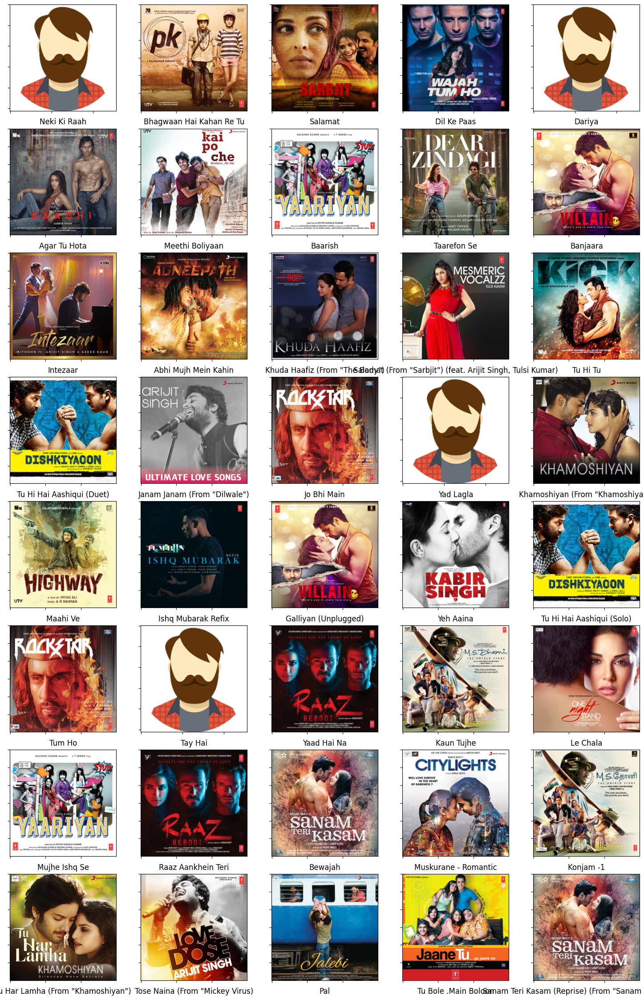

In [66]:
visualize_songs(mumbai_top40,default_image)